In [1]:
import kagglehub
trolukovich_food11_image_dataset_path = kagglehub.dataset_download('trolukovich/food11-image-dataset')

print('Data source import complete.')


100%|██████████| 1.08G/1.08G [00:18<00:00, 63.6MB/s]

Extracting files...


Data source import complete.


In [2]:
# import the necessary packages
import pandas as pd
import numpy as np
import tensorflow as tf
import os
import random
import matplotlib.pyplot as plt
import PIL
import seaborn as sns
from IPython.display import display
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from random import sample
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model

In [4]:
print("Path to dataset files:", path)

Path to dataset files: ../input/food11-image-dataset


In [11]:
import os

# Set the paths for training and validation data
# Assuming the downloaded dataset is in 'trolukovich_food11_image_dataset_path/training' and 'trolukovich_food11_image_dataset_path/validation'
path_train = os.path.join(trolukovich_food11_image_dataset_path, 'training')
path_test = os.path.join(trolukovich_food11_image_dataset_path, 'validation')

train = {}
test = {}

# Make dictionary storing images for each category under train data.
for i in os.listdir(path_train):
    train[i] = os.listdir(os.path.join(path_train, i))

# Make dictionary storing images for each category under test data.
for i in os.listdir(path_test):
    test[i] = os.listdir(os.path.join(path_test, i))

In [12]:
# View the number of images in the entire training and testing datasets respectively.
len_train = np.concatenate(list(train.values())).shape[0]
len_test = np.concatenate(list(test.values())).shape[0]

print("Number of images in training data : {}".format(len_train))
print("Number of images in testing data : {}".format(len_test))

Number of images in training data : 9866
Number of images in testing data : 3430


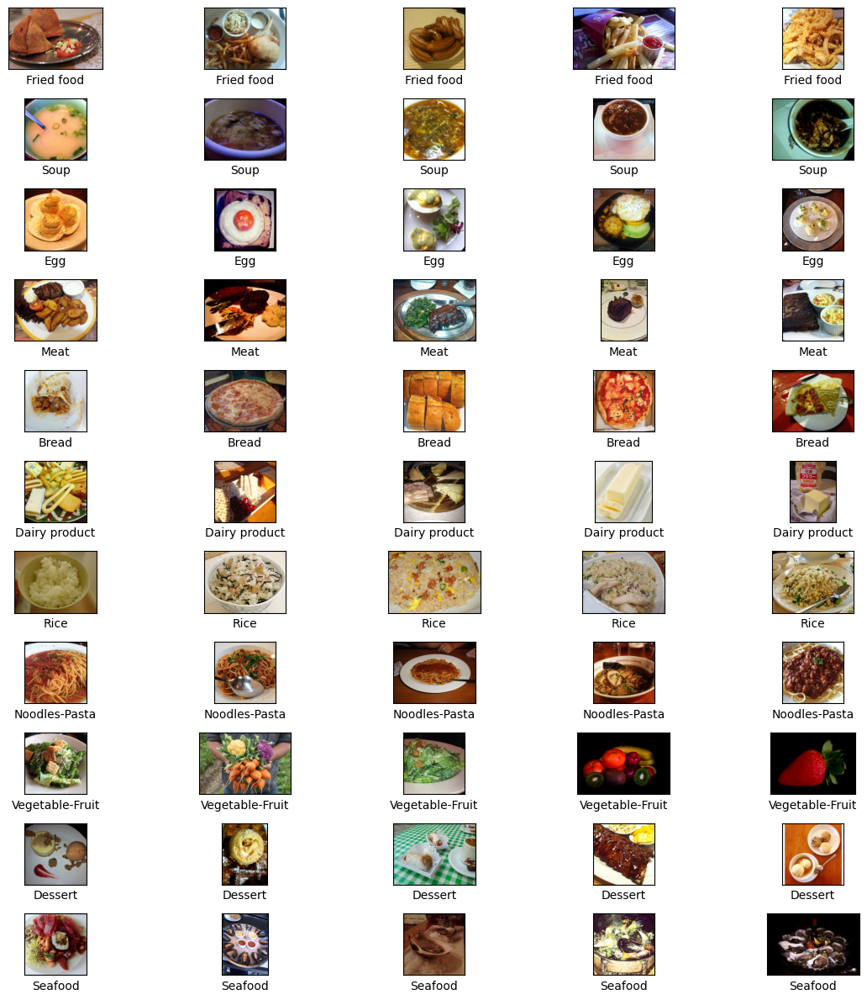

In [14]:
fig, axs = plt.subplots(len(train.keys()), 5, figsize = (12, 12))
for i, item in enumerate(os.listdir(path_train)):
    images = sample(train[item], 5)

    for j, image in enumerate(images):
        img = PIL.Image.open(os.path.join(path_train, item, image))
        axs[i, j].imshow(img)
        axs[i, j].set(xlabel = item, xticks = [], yticks = [])

fig.tight_layout()

In [15]:
for item in train.keys():
    print(item, len(train[item]))

Fried food 848
Soup 1500
Egg 986
Meat 1325
Bread 994
Dairy product 429
Rice 280
Noodles-Pasta 440
Vegetable-Fruit 709
Dessert 1500
Seafood 855


In [16]:
train_datagen = ImageDataGenerator(
    zoom_range = 0.2,
    horizontal_flip = True,
    vertical_flip = True,
    rescale=1./255
)

test_datagen = ImageDataGenerator(rescale=1./255)

In [17]:
# Train
train_generator = train_datagen.flow_from_directory(
    path_train,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

# Test generator
test_generator = test_datagen.flow_from_directory(
    path_test,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.


In [18]:
basemodel = InceptionResNetV2(
    weights = "imagenet",
    include_top = False, # Classification layer (output layer- sigmoid activations)
    input_tensor = Input((256, 256, 3))
)

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [19]:
# print summary
basemodel.summary()

Model: "inception_resnet_v2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 127, 127,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 127, 127,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 127, 127,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 125, 125,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 125, 125,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 125, 125,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 125, 125,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 125, 125,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 125, 125,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 62, 62,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 62, 62,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 62, 62,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 62, 62,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 60, 60,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 60, 60,    │          0 │ batch_normalizat

 Total params: 54,336,736 (207.28 MB)

 Trainable params: 54,276,192 (207.05 MB)

 Non-trainable params: 60,544 (236.50 KB)

In [20]:
# Freeze the basemodel weights
basemodel.trainable = False

In [21]:
# Add classification head to the model
headmodel = basemodel.output
headmodel = GlobalAveragePooling2D(name = "Global_Average_Pool")(headmodel)
headmodel = Flatten(name = "flatten")(headmodel)
headmodel = Dense(256, activation = "relu", name = "dense_1")(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(128, activation = "relu", name = "dense_2")(headmodel)
headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(11, activation = "softmax", name = "output")(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [23]:
model.compile(
    loss = "categorical_crossentropy",
    optimizer = SGD(
        learning_rate = 0.01, # Change 'lr' to 'learning_rate'
        momentum = 0.9
    ),
    metrics = ["accuracy"]
)

In [26]:
earlystopping = EarlyStopping(
    monitor = 'loss',
    verbose = 1,
    patience = 20
)

# save the best model with lower loss
checkpointer = ModelCheckpoint(
    filepath = "weights.keras",  # Changed to '.keras'
    verbose = 1,
    save_best_only = True
)

In [27]:
#fitting
history = model.fit(
    train_generator,
    steps_per_epoch = train_generator.n // 32,
    epochs = 1,
    callbacks = [checkpointer, earlystopping]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)


308/308 ━━━━━━━━━━━━━━━━━━━━ 3240s 10s/step - accuracy: 0.5208 - loss: 1.4464


/usr/local/lib/python3.11/dist-packages/keras/src/callbacks/model_checkpoint.py:209: UserWarning: Can save best model only with val_loss available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


### Fine tuning

In [28]:
# Unfreeze
basemodel.trainable = True

In [30]:
earlystopping = EarlyStopping(
    monitor = 'loss',
    verbose = 1,
    patience = 20
)

checkpointer = ModelCheckpoint(
    filepath = "weights_fine.keras",  # Changed to '.keras'
    verbose = 1,
    save_best_only = True
)

In [34]:
history = model.fit(
    train_generator,
    steps_per_epoch = train_generator.n // 32,
    epochs = 1,
    callbacks = [checkpointer, earlystopping]
)

308/308 ━━━━━━━━━━━━━━━━━━━━ 3184s 10s/step - accuracy: 0.7406 - loss: 0.8005


/usr/local/lib/python3.11/dist-packages/keras/src/callbacks/model_checkpoint.py:209: UserWarning: Can save best model only with val_loss available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


In [36]:
evaluate = model.evaluate(
    test_generator,
    steps = test_generator.n // 32,
    verbose = 1
)

print('Accuracy Test : {}'.format(evaluate[1]))

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)


107/107 ━━━━━━━━━━━━━━━━━━━━ 1078s 10s/step - accuracy: 0.8048 - loss: 0.6163
Accuracy Test : 0.8002336621284485


In [37]:
# Assigning label names to the corresponding indexes
labels = {
    0: 'Bread',
    1: 'Dairy product',
    2: 'Dessert',
    3: 'Egg',
    4: 'Fried food',
    5: 'Meat',
    6: 'Noodles-Pasta',
    7: 'Rice',
    8: 'Seafood',
    9: 'Soup',
    10: 'Vegetable-Fruit'
}

In [39]:
import os
import PIL
import numpy as np
import matplotlib.pyplot as plt
import random

# Assigning label names to the corresponding indexes
labels = {
    0: 'Bread',
    1: 'Dairy product',
    2: 'Dessert',
    3: 'Egg',
    4: 'Fried food',
    5: 'Meat',
    6: 'Noodles-Pasta',
    7: 'Rice',
    8: 'Seafood',
    9: 'Soup',
    10: 'Vegetable-Fruit'
}

prediction = []
original = []
image = []
count = 0

path_eval = os.path.join(trolukovich_food11_image_dataset_path, 'evaluation')


if not os.path.exists(path_eval):
    raise FileNotFoundError(f"Evaluation directory not found: {path_eval}")

for i in os.listdir(path_eval):
    for item in os.listdir(os.path.join(path_eval, i)):
        img = PIL.Image.open(os.path.join(path_eval, i, item))
        img = img.resize((256, 256))
        image.append(img)
        img = np.asarray(img, dtype=np.float32)
        # normalizing
        img = img / 255
        # reshaping the image into a 4D array
        img = img.reshape(-1, 256, 256, 3)
        predict = model.predict(img)
        predict = np.argmax(predict)
        prediction.append(labels[predict])
        original.append(i)

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 340ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

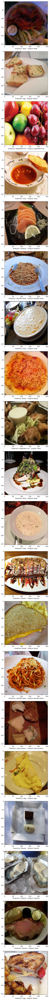

In [40]:
# Visualizing the results
fig=plt.figure(figsize = (100,100))
for i in range(20):
    j = random.randint(0,len(image))
    fig.add_subplot(20,1,i+1)
    plt.xlabel("Prediction -" + prediction[j] +"   Original -" + original[j])
    plt.imshow(image[j])
fig.tight_layout()
plt.show()

In [41]:
# Check out the Classification Report
print(classification_report(np.asarray(prediction), np.asarray(original)))


                 precision    recall  f1-score   support

          Bread       0.89      0.62      0.73       526
  Dairy product       0.49      0.88      0.63        83
        Dessert       0.79      0.76      0.77       523
            Egg       0.71      0.73      0.72       328
     Fried food       0.61      0.86      0.71       203
           Meat       0.85      0.84      0.85       437
  Noodles-Pasta       0.98      0.98      0.98       147
           Rice       0.98      0.97      0.97        97
        Seafood       0.77      0.91      0.83       258
           Soup       0.95      0.95      0.95       500
Vegetable-Fruit       0.96      0.90      0.93       245

       accuracy                           0.82      3347
      macro avg       0.82      0.85      0.83      3347
   weighted avg       0.84      0.82      0.82      3347



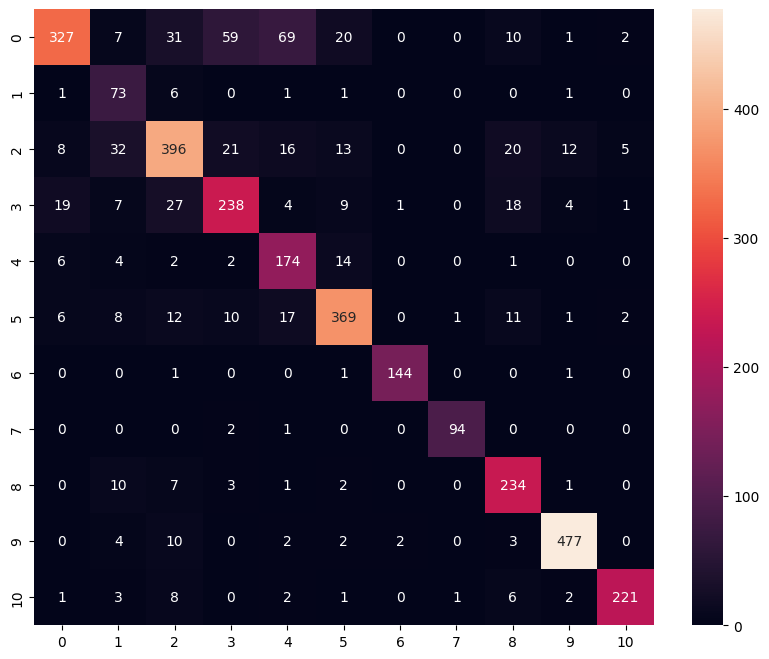

In [42]:
plt.figure(figsize = (10, 8))
cm = confusion_matrix(np.asarray(prediction), np.asarray(original))
sns.heatmap(
    cm,
    annot = True,
    fmt = "d"
)
plt.show()